In [1]:
from platform import python_version

print(python_version())

3.5.2


#### october 2019

### Задача: классифицировать корпус новостей с сайта Lenta.ru https://www.kaggle.com/yutkin/corpus-of-russian-news-articles-from-lenta/

##### План:
1. Прочитать данные, посмотреть на распределение классов, слов, пропусков.
2. Функция предобработки данных 
3. В качестве базового алгоритма будем использовать Vowpal Wabbit
4. Простенькая нейронная сеть с LSTM слоем
5. Сделаем стемминг для слов и повторим 3. и 4. шаги
6. Сделаем лемматизацию для слов и повторим 3. и 4. шаги
7. TF-IDF на stemmed словах и линейный алгоритм
8. BERT, попробуем его встроенный классификатор
9. Вывод и что можно было еще сделать

In [1]:
import tensorflow as tf; print(tf.__version__)

2.0.0


In [6]:
import nltk
from nltk.corpus import stopwords
import re
import pandas as pd
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import confusion_matrix
import seaborn as sn

from nltk import word_tokenize
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from keras.utils.np_utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout

from sklearn.preprocessing import LabelEncoder
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Using TensorFlow backend.
/home/bolelov-ivan/environments/python35/lib/python3.5/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['random']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


### 1. Посмотрим на данные

In [11]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/bolelov-
[nltk_data]     ivan/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [2]:
filename = "news_lenta.csv"
df = pd.read_csv(filename, sep=',') #, skiprows=skip)
df.head()

,tags,text,title,topic,url
0,Общество,Миллиардер Илон Маск в резкой форме ответил бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/
1,Рынки,США и их западные союзники рассматривают возмо...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/
2,Преступность,Празднование победы сборной Франции на чемпион...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/
3,Политика,География использования лимузинов проекта «Кор...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/
4,Музыка,Американская поп-певица Бритни Спирс случайно ...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/


In [7]:
df.isna().sum().to_frame()

,0
tags,24049
text,0
title,0
topic,0
url,0


In [8]:
print('length df before: ', len(df))
df = df.dropna(subset=['topic', 'text'])
print('length df after: ', len(df))

length df before:  699746
length df after:  699746


In [9]:
df['topic'].value_counts()

Россия               158072
Мир                  134334
Экономика             77673
Спорт                 62463
Культура              52600
Бывший СССР           52018
Наука и техника       51869
Интернет и СМИ        43313
Из жизни              26356
Силовые структуры     18480
Бизнес                 7398
Ценности               6832
Путешествия            6045
69-я параллель         1095
Крым                    666
Культпросвет            340
Легпром                 114
Библиотека               65
Дом                       6
Оружие                    3
ЧМ-2014                   2
МедНовости                1
Сочи                      1
Name: topic, dtype: int64

### 2. Предобработка данных

clean_text - очистка текста от стоп слов, небуквенных символов

open_preprocess_df - загрузка исходных данных в dataframe, очистка от nan, применение clean_text к каждому тексту, выставление target колонки для Vowpal Wabbit

In [7]:
STOPWORDS = set(stopwords.words('russian')).union(set(stopwords.words('english')))
BAD_SYMBOLS_RE = re.compile(u'[^0-9a-zа-я# +_]')
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;:]')

def clean_text(text):
    text = text.lower()
    text = REPLACE_BY_SPACE_RE.sub(' ', text)
    text = BAD_SYMBOLS_RE.sub('', text)
    text = text.replace('x', '')
    text = re.sub('\.+', '.', text)
    text = re.sub('\d+', '', text)
    text = ' '.join(word for word in text.split() if word not in STOPWORDS)
    return text


def open_preprocess_df(filename):
    df = pd.read_csv(filename, sep=',') #, skiprows=skip)
    df = df.dropna(subset=['topic', 'text'])
    df['text'] = df['text'].apply(clean_text)
    factorization = pd.factorize(df['topic'])
    df['target'], labels = factorization[0] + 1, factorization[1]
    return df, labels


In [16]:
df, labels = open_preprocess_df("news_lenta.csv")

In [17]:
df['text'][500000]

'сотрудники департамента охраны здоровья южной эстонии полагают клопы дождь которых выпал острове рухну ночь сентября ранее жили побережье латвии сообщает иа regnum мнению специалистов соседнее государство насекомых перенес сильный шторм ранее подобную версию выдвинул эстонский энтомолог урмас тартес ученый отметил клопы плохо летают самостоятельно добраться острова смогли дожде клопов выпавшем рухну сообщила эстонская газета eesti paevaleht местная учительница аве вийрмаа рассказала сначала приняла это явление град однако свете фонаря увидела неба падает огромное количество насекомых следующее утро насекомые повсюду бельевых веревках лодках автомобилях камнях энтомолог урмас тартес предположил относятся семейству щитников щитники правило питаются растениями среди плотоядные департаменте охраны здоровья считают жителям рухну опасаться стоит мнению специалистов данном случае речь идет клопах которые питаются соком растений'

In [18]:
# преобразование выборк в формат VW
def to_vw_format(document, label=None):
    return str(label or '') + ' |text ' + ' '.join(re.findall('\w{3,}', document.lower())) + '\n'


In [19]:
print('кол-во классов: ', len(set(df['target'])))

кол-во классов:  23


In [8]:
# нарисовать два графика precision и recall для каждого класса
def draw_prec_rec(y_test, valid_prediction):
    cm = confusion_matrix(y_test, valid_prediction)
    recall = np.diag(cm) / np.sum(cm, axis = 1)
    precision = np.diag(cm) / np.sum(cm, axis = 0)
    
    
    f, (ax1, ax2) = plt.subplots(2, 1,figsize=(20,15))
    f.tight_layout(pad=20.4, w_pad=0.5, h_pad=10.0)
    ax1.grid(True), ax2.grid(True)
    recall = list(recall) + [0.] * (len(labels) - len(recall))
    precision = list(precision) + [0.] * (len(labels) - len(precision))
    ax1.plot(list(labels), recall)
    ax1.set_xticklabels(labels, rotation=45)
    ax1.set_title('Recall')
    ax2.plot(list(labels), precision)
    ax2.set_xticklabels(labels, rotation=45)
    ax2.set_title('Precision')

### 3. Попробуем VW

Разоъем выборку на train и test

In [21]:
X_train, X_test, y_train, y_test = train_test_split(df['text'], df['target'], test_size=0.3, random_state=42)

# Convert and save in vowpal wabbit format
with open('text_train.vw', 'w') as vw_train_data:
    for text, target in zip(X_train, y_train):
        vw_train_data.write(to_vw_format(str(text), target))
with open('text_valid.vw', 'w') as vw_train_data:
    for text, target in zip(X_test, y_test):
        vw_train_data.write(to_vw_format(str(text), target))

In [22]:
!vw --oaa 23 -d text_train.vw --loss_function logistic -f text_model.vw

final_regressor = text_model.vw
Num weight bits = 18
learning rate = 0.5
initial_t = 0
power_t = 0.5
using no cache
Reading datafile = text_train.vw
num sources = 1
average  since         example        example  current  current  current
loss     last          counter         weight    label  predict features
1.000000 1.000000            1            1.0        8        1      242
1.000000 1.000000            2            2.0        7        8      227
1.000000 1.000000            4            4.0        4        2      129
0.875000 0.750000            8            8.0        8        3      154
0.875000 0.875000           16           16.0       15        3      161
0.718750 0.562500           32           32.0        3        3      115
0.671875 0.625000           64           64.0        6        3      220
0.656250 0.640625          128          128.0        1        1      121
0.601562 0.546875          256          256.0        3        3      149
0.494141 0.386719          512  

In [23]:
!vw -i text_model.vw -t -d text_valid.vw -p text_valid_pred.txt --quiet

In [24]:
with open('text_valid_pred.txt') as pred_file:
    valid_prediction = [float(label) for label in pred_file.readlines()]
    print("Accuracy: {}".format(round(accuracy_score(y_test, valid_prediction), 5)))


Accuracy: 0.81165


Будем считать данный accuracy бэйзлайном и посмотрим на матрицу ошибок

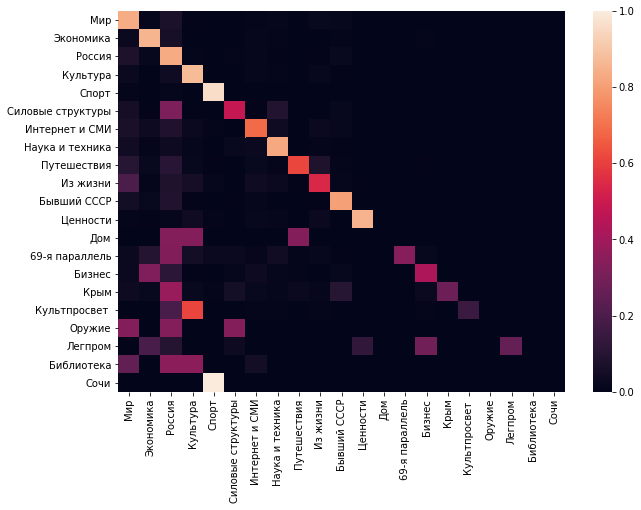

In [38]:
cm = confusion_matrix(y_test, valid_prediction)
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

names = []
for label in labels:
    if label not in ('ЧМ-2014', 'МедНовости'):
        names.append(label)
df_cm = pd.DataFrame(cm, index = names,
                  columns = names)
plt.figure(figsize = (10,7))
sn.heatmap(df_cm)

In [18]:
# вынесем отрисовку матрицы ошибок в отдельную функцию, чтобы не копипастить
def draw_confusions_matrix(y_test, valid_prediction):
    cm = confusion_matrix(y_test, valid_prediction)
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    names = []
    for label in labels:
        if label not in ('ЧМ-2014', 'МедНовости'):
            names.append(label)
    df_cm = pd.DataFrame(cm, index = names,
                      columns = names)
    plt.figure(figsize = (10,7))
    sn.heatmap(df_cm)

##### Ради интереса попробовал запустить VW на заголовках и на биграммах и триграммах их

In [15]:
data = {'VW text': [0.80], 'VW title': [0.59], 'VW title 2gramm': [0.53], 'VW title 3gramm': [0.49]}
df_summary = pd.DataFrame(data=data)
print('Результаты accuracy разных запусков Vowpal Wabbit:')
df_summary.head()

Результаты accuracy разных запусков Vowpal Wabbit:


,VW text,VW title,VW title 2gramm,VW title 3gramm
0,0.8,0.59,0.53,0.49


### 4. Запустим нейронную сеть

Проиндексируем самые частотные слова

In [60]:
# Максимальное количество слов, которое будет использовано (самые частотные)
NUM_WORDS = 64000
# Максимальное количество слов в тексте
MAX_SEQUENCE_LENGTH = 250

tokenizer = Tokenizer(num_words=NUM_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(df['text'].values)
word_index = tokenizer.word_index
print('Количество уникальных токенов:', len(word_index))

Количество уникальных токенов: 1197178


Преобразуем тексты в последовательность токенов

In [61]:
X = tokenizer.texts_to_sequences(df['text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print(X.shape)

(699746, 250)


Преобразуем классы текстов в one-hot представления для cross entropy loss в конце нейронной сети

In [62]:
Y = pd.get_dummies(df['topic']).values
print(Y.shape)

(699746, 23)


In [63]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(489822, 250) (489822, 23)
(209924, 250) (209924, 23)


Структура нейронной сети:

In [64]:
EMBEDDING_DIM = 256

model = Sequential()
model.add(Embedding(NUM_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(256, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(100, activation='tanh'))
model.add(Dense(23, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 250, 256)          16384000  
_________________________________________________________________
spatial_dropout1d_1 (Spatial (None, 250, 256)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dense_1 (Dense)              (None, 100)               25700     
_________________________________________________________________
dense_2 (Dense)              (None, 23)                2323      
Total params: 16,937,335
Trainable params: 16,937,335
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
epochs = 10
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=5, min_delta=0.0001)])

Train on 440839 samples, validate on 48983 samples
Epoch 1/10
329856/440839 [=====================>........] - ETA: 15:44 - loss: 0.7477 - accuracy: 0.7630

In [159]:
model.save_weights("model.h5")

In [157]:
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)

In [69]:
pred = model.predict(X_test)

In [70]:
true, pred = Y_test.argmax(axis=1), pred.argmax(axis=1)

In [71]:
print("Accuracy: {}".format(round(accuracy_score(Y_test.argmax(axis=1), valid_prediction.argmax(axis=1)), 5)))

Accuracy: 0.83433


Accuracy получше, но не сильно отличается, но если посмотреть на матрицу ошибок, то кажется, что ошибки более осмысленные, например нейронная сеть путает темы "Россия" и "Бывший СССР", "Россия" и "Сочи"

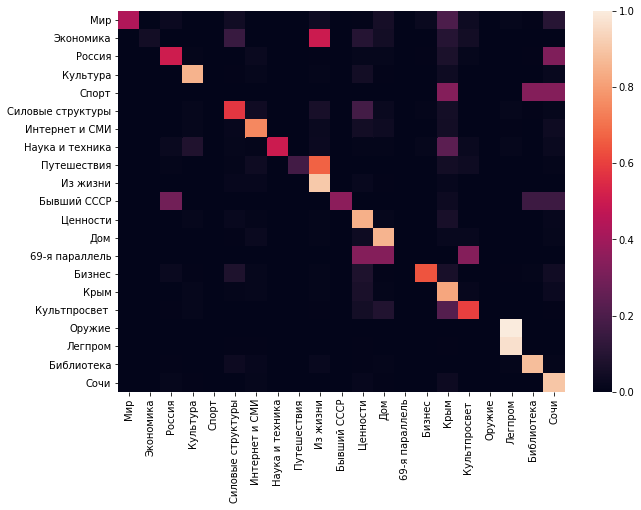

In [74]:
draw_confusions_matrix(true, pred)

### 5. Попробуем использавать Стемминг и запустить VW и такую же архитектуру нейронной сети

Проделаем все те же самые шаги для stemmed текстов

In [84]:
from nltk.stem.snowball import SnowballStemmer
from copy import deepcopy
stemmer = SnowballStemmer("russian") 

In [83]:
stemmer.stem('красивый')

'красив'

In [93]:
def stem_text(text):
    return' '.join([stemmer.stem(word) for word in text.split()])

In [95]:
df_stemmed = deepcopy(df)
df_stemmed['text'] = df_stemmed['text'].apply(stem_text)

In [97]:
df_stemmed.to_csv('df_stemmed.csv')

In [98]:
X_train, X_test, y_train, y_test = train_test_split(df_stemmed['text'], df_stemmed['target'], test_size=0.3, random_state=42)

# Convert and save in vowpal wabbit format
with open('text_train_stemmed.vw', 'w') as vw_train_data:
    for text, target in zip(X_train, y_train):
        vw_train_data.write(to_vw_format(str(text), target))
with open('text_valid_stemmed.vw', 'w') as vw_train_data:
    for text, target in zip(X_test, y_test):
        vw_train_data.write(to_vw_format(str(text), target))

In [99]:
!vw --oaa 23 -d text_train_stemmed.vw --loss_function logistic -f text_model_stemmed.vw

final_regressor = text_model_stemmed.vw
Num weight bits = 18
learning rate = 0.5
initial_t = 0
power_t = 0.5
using no cache
Reading datafile = text_train_stemmed.vw
num sources = 1
average  since         example        example  current  current  current
loss     last          counter         weight    label  predict features
1.000000 1.000000            1            1.0        8        1      241
1.000000 1.000000            2            2.0        7        8      220
1.000000 1.000000            4            4.0        4        2      122
0.750000 0.500000            8            8.0        8        4      152
0.750000 0.750000           16           16.0       15        3      159
0.593750 0.437500           32           32.0        3        3      114
0.562500 0.531250           64           64.0        6        3      220
0.546875 0.531250          128          128.0        1        1      119
0.468750 0.390625          256          256.0        3        3      143
0.414062 0.35937

In [100]:
!vw -i text_model_stemmed.vw -t -d text_valid_stemmed.vw -p text_valid_pred_stemmed.txt --quiet

Accuracy: 0.82463


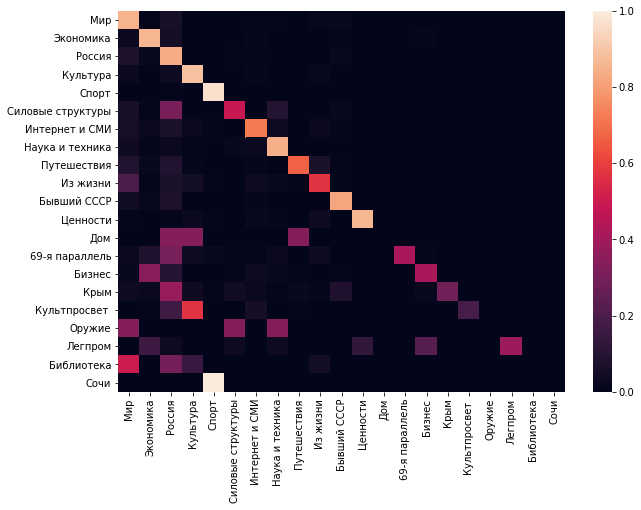

In [101]:
with open('text_valid_pred_stemmed.txt') as pred_file:
    valid_prediction = [float(label) for label in pred_file.readlines()]
    print("Accuracy: {}".format(round(accuracy_score(y_test, valid_prediction), 5)))

draw_confusions_matrix(y_test, valid_prediction)

Accuracy лучше, но структурно, результаты не сильно поменялись. Линейный алгоритм путает класс "Дом" с "Россия" и "Культура"

#### 5.б Запустим нейронную сеть на stemmed данных

In [103]:
tokenizer2 = Tokenizer(num_words=NUM_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer2.fit_on_texts(df_stemmed['text'].values)
word_index2 = tokenizer2.word_index
print('Количество уникальных токенов:', len(word_index2))

Количество уникальных токенов: 642897
(699746, 250)
(699746, 23)
(489822, 250) (489822, 23)
(209924, 250) (209924, 23)


In [128]:
X = tokenizer2.texts_to_sequences(df_stemmed['text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print(X.shape)

Y = pd.get_dummies(df_stemmed['topic']).values
print(Y.shape)

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(699746, 250)
(699746, 23)
(489822, 250) (489822, 23)
(209924, 250) (209924, 23)


In [104]:
model2 = Sequential()
model2.add(Embedding(NUM_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model2.add(SpatialDropout1D(0.2))
model2.add(LSTM(256, dropout=0.2, recurrent_dropout=0.2))
model2.add(Dense(100, activation='tanh'))
model2.add(Dense(23, activation='softmax'))
model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model2.summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 250, 256)          16384000  
_________________________________________________________________
spatial_dropout1d_2 (Spatial (None, 250, 256)          0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dense_3 (Dense)              (None, 100)               25700     
_________________________________________________________________
dense_4 (Dense)              (None, 23)                2323      
Total params: 16,937,335
Trainable params: 16,937,335
Non-trainable params: 0
_________________________________________________________________
None


Уменьшил количество эпох в 2 раза, чтобы быстрее обучалось.

In [105]:
epochs = 5
batch_size = 64

history = model2.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=5, min_delta=0.0001)])

Train on 440839 samples, validate on 48983 samples
Epoch 1/5
440839/440839 [==============================] - 4016s 9ms/sample - loss: 0.6659 - accuracy: 0.7854 - val_loss: 0.4295 - val_accuracy: 0.8483
Epoch 2/5
440839/440839 [==============================] - 3905s 9ms/sample - loss: 0.3677 - accuracy: 0.8709 - val_loss: 0.4087 - val_accuracy: 0.8555
Epoch 3/5
243904/440839 [===============>..............] - ETA: 31:18 - loss: 0.2642 - accuracy: 0.9067

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



354240/440839 [=======================>......] - ETA: 13:58 - loss: 0.1956 - accuracy: 0.9306

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



440839/440839 [==============================] - 4438s 10ms/sample - loss: 0.1464 - accuracy: 0.9477 - val_loss: 0.5719 - val_accuracy: 0.8426


In [126]:
model2.save_weights("model2.h5")

In [158]:
model_json = model2.to_json()
with open("model2.json", "w") as json_file:
    json_file.write(model_json)

In [129]:
pred = model2.predict(X_test)

In [132]:
true, pred = Y_test.argmax(axis=1), pred.argmax(axis=1)

Accuracy: 0.84629


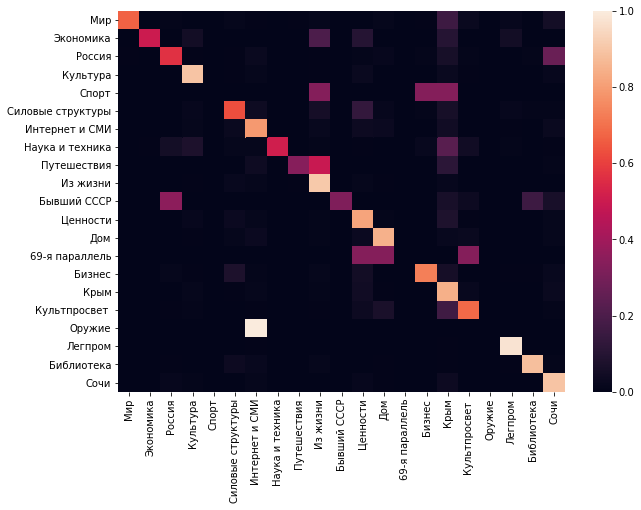

In [113]:
print("Accuracy: {}".format(round(accuracy_score(true, pred), 5)))

draw_confusions_matrix(true, pred)

/home/bolelov-ivan/environments/python35/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


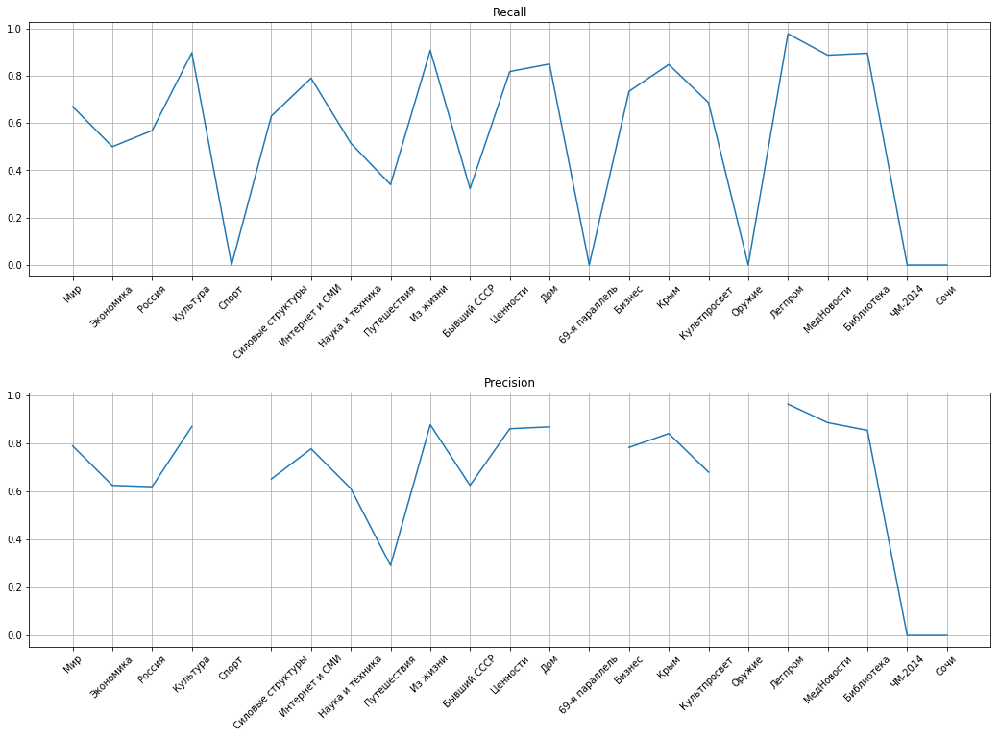

In [133]:
draw_prec_rec(true, pred)

### 6. Сделаем Лемматизацию текста и обучим также VW и нейронную сеть

Обучал VW и нейронную сеть параллельно в другом ноутбуке, поэтому загружу просто результаты оттуда:

Результаты VW: Accuracy: 0.82478, матрица ошибок примерно такая же, как и раньше.

Посморим на результаты нейронной сети:

In [3]:
from tensorflow.keras.models import load_model, model_from_json

In [4]:
json_file = open('model3.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("model3.h5")

In [11]:
df_lemmatized = pd.read_csv('df_lemmatized.csv')
df_lemmatized.head()

,Unnamed: 0,tags,text,title,topic,url,target
0,0,Общество,миллиардер илона маск резкий форма отвечать бр...,Илон Маск назвал педофилом спасавшего детей из...,Мир,https://lenta.ru/news/2018/07/16/su57/,1
1,1,Рынки,сша западный союзник рассматривать возможность...,США задумались о распечатывании нефтяного резерва,Экономика,https://lenta.ru/news/2018/07/16/foes/,2
2,2,Преступность,празднование победа сборная франция чемпионат ...,Празднование победы на ЧМ во Франции закончило...,Мир,https://lenta.ru/news/2018/07/15/fra_bezumie/,1
3,3,Политика,география использование лимузин проект кортеж ...,Песков рассказал о планах на президентские лим...,Россия,https://lenta.ru/news/2018/07/16/delo_shyut/,3
4,4,Музыка,американский поппевица бритни спирс случайно п...,Грудь Бритни Спирс вновь выскочила из лифчика ...,Культура,https://lenta.ru/news/2018/07/16/pedomusk/,4


In [12]:
# Максимальное количество слов, которое будет использовано (самые частотные)
NUM_WORDS = 64000
# Максимальное количество слов в тексте
MAX_SEQUENCE_LENGTH = 250

In [ ]:
tokenizer3 = Tokenizer(num_words=NUM_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer3.fit_on_texts(df_lemmatized['text'].values)
word_index3 = tokenizer3.word_index
print('Количество уникальных токенов:', len(word_index3))

In [14]:
X = tokenizer3.texts_to_sequences(df_lemmatized['text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print(X.shape)

Y = pd.get_dummies(df_lemmatized['topic']).values
print(Y.shape)

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(699746, 250)
(699746, 23)
(489822, 250) (489822, 23)
(209924, 250) (209924, 23)


In [15]:
pred = loaded_model.predict(X_test)

In [16]:
true, pred = Y_test.argmax(axis=1), pred.argmax(axis=1)

Accuracy: 0.84677


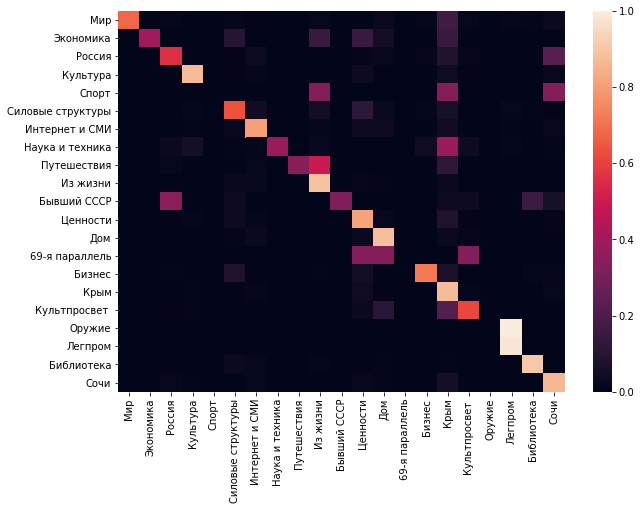

In [20]:
print("Accuracy: {}".format(round(accuracy_score(true, pred), 5)))

factorization = pd.factorize(df_lemmatized['topic'])
labels = factorization[1]

draw_confusions_matrix(true, pred)

Качество чуть-чуть получше, чем на stemmed словах, матрица ошибок почти не поменялась.

### 7. Попробуем TF-IDF на stemmed словах

In [114]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [136]:
tfid_vectorizer = TfidfVectorizer()

X = tfid_vectorizer.fit_transform(df_stemmed['text'].values)

In [117]:
from sklearn.linear_model import RidgeClassifier

In [137]:
X_train, X_test, y_train, y_test = train_test_split(X, df_stemmed['target'], test_size=0.3, random_state=42)

In [118]:
RC = RidgeClassifier(alpha=1.)
RC.fit(X_train, y_train)

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=None,
                solver='auto', tol=0.001)

In [138]:
pred_ridge = RC.predict(X_test)

Accuracy: 0.84389


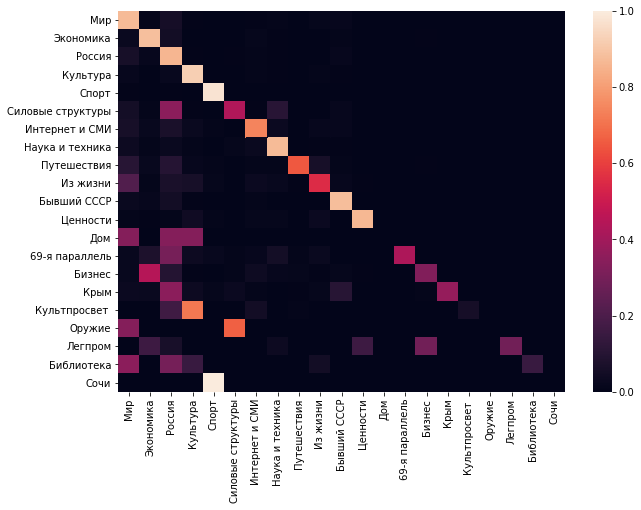

In [125]:
print("Accuracy: {}".format(round(accuracy_score(y_test, pred_ridge), 5)))

draw_confusions_matrix(y_test, pred_ridge)

Качество неплохое, но матрица ошибок похожа на VW, что логично в целом.

/home/bolelov-ivan/environments/python35/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


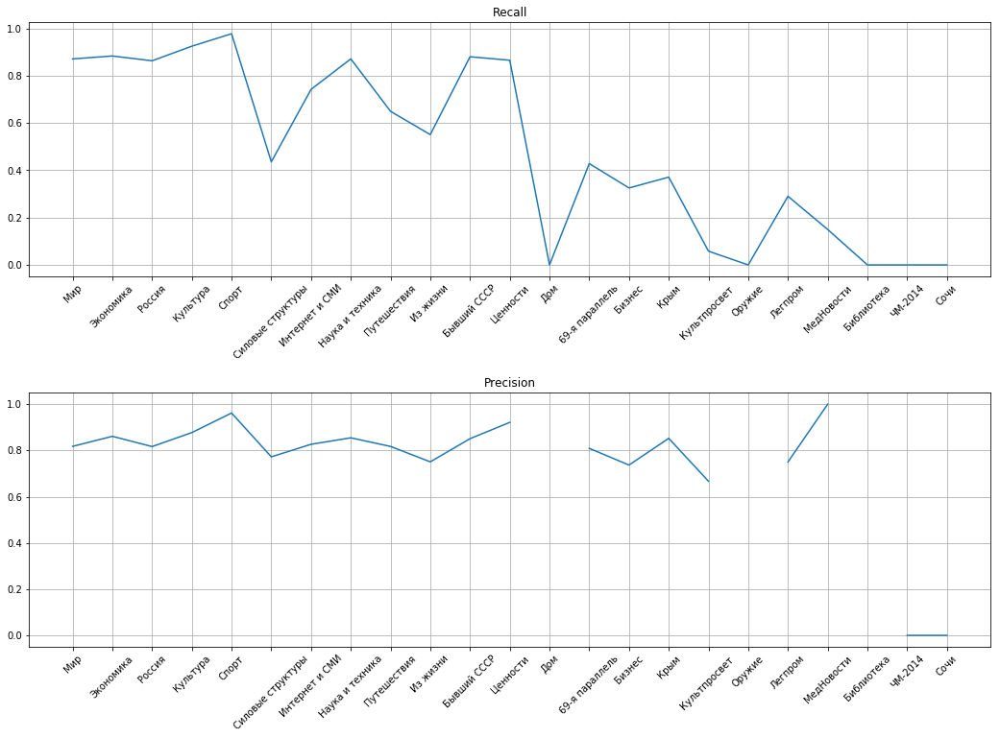

In [141]:
draw_prec_rec(y_test, pred_ridge)

### 8. Попробуем state of the art решение BERT

Попробуем встроенный классификатор

le = LabelEncoder()

In [4]:
df_bert = pd.DataFrame({'user_id':df.index,
            'label':le.fit_transform(df['topic']),
            'alpha':['a']*df.shape[0],
            'text':df['text'].replace(r'\n',' ',regex=True)})
 
df_bert_train, df_bert_test = train_test_split(df_bert, test_size=0.3, random_state=42)

df_bert_train, df_bert_dev = train_test_split(df_bert_train, test_size=0.01, random_state=42)
 
# Saving dataframes to .tsv format as required by BERT
df_bert_train.to_csv('data/train.tsv', sep='\t', index=False, header=False)
df_bert_dev.to_csv('data/dev.tsv', sep='\t', index=False, header=False)
df_bert_test.to_csv('data/test.tsv', sep='\t', index=False, header=True)


Сначала пробовал запустить как питоновский скрипт с параметрами, но он не печатал лосс, считался трое суток, в итоге мое терпение не выдержало неизвестности и я параллельно запустил уже в юпитере (код ниже).

In [ ]:
!python ~/BERT/bert/run_classifier.py  \
--task_name=cola  \
--do_train=true  \
--do_eval=true  \
--do_predict=true  \
--data_dir=./data/  \
--vocab_file=./multi_cased_L-12_H-768_A-12/vocab.txt  \
--bert_config_file=./multi_cased_L-12_H-768_A-12/bert_config.json  \
--init_checkpoint=./multi_cased_L-12_H-768_A-12/bert_model.ckpt  \
--max_seq_length=400  \
--train_batch_size=8  \
--learning_rate=2e-5  \
--num_train_epochs=3.0  \
--output_dir=./bert_output/  \
--do_lower_case=False

/home/bolelov-ivan/environments/python35/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/bolelov-ivan/environments/python35/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/bolelov-ivan/environments/python35/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/bolelov-ivan/environme

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



INFO:tensorflow:global_step/sec: 0.191968
I1016 10:17:27.576320 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.191968
INFO:tensorflow:examples/sec: 1.53575
I1016 10:17:27.576700 140705687701248 tpu_estimator.py:2160] examples/sec: 1.53575
INFO:tensorflow:global_step/sec: 0.197548
I1016 10:17:32.638653 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.197548
INFO:tensorflow:examples/sec: 1.58038
I1016 10:17:32.639373 140705687701248 tpu_estimator.py:2160] examples/sec: 1.58038
INFO:tensorflow:global_step/sec: 0.198371
I1016 10:17:37.679718 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.198371
INFO:tensorflow:examples/sec: 1.58697
I1016 10:17:37.680062 140705687701248 tpu_estimator.py:2160] examples/sec: 1.58697
INFO:tensorflow:global_step/sec: 0.200541
I1016 10:17:42.665975 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.200541
INFO:tensorflow:examples/sec: 1.60433
I1016 10:17:42.666390 140705687701248 tpu_estimator.py:2160] examples/sec: 1.60433


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



INFO:tensorflow:global_step/sec: 0.19237
I1017 12:51:16.589095 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.19237
INFO:tensorflow:examples/sec: 1.53896
I1017 12:51:16.589551 140705687701248 tpu_estimator.py:2160] examples/sec: 1.53896
INFO:tensorflow:global_step/sec: 0.189742
I1017 12:51:21.859430 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.189742
INFO:tensorflow:examples/sec: 1.51793
I1017 12:51:21.859839 140705687701248 tpu_estimator.py:2160] examples/sec: 1.51793
INFO:tensorflow:global_step/sec: 0.191303
I1017 12:51:27.086720 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.191303
INFO:tensorflow:examples/sec: 1.53043
I1017 12:51:27.087100 140705687701248 tpu_estimator.py:2160] examples/sec: 1.53043
INFO:tensorflow:global_step/sec: 0.190799
I1017 12:51:32.327834 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.190799
INFO:tensorflow:examples/sec: 1.52639
I1017 12:51:32.328213 140705687701248 tpu_estimator.py:2160] examples/sec: 1.52639
IN

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



INFO:tensorflow:global_step/sec: 0.187641
I1017 21:32:18.658370 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.187641
INFO:tensorflow:examples/sec: 1.50113
I1017 21:32:18.658743 140705687701248 tpu_estimator.py:2160] examples/sec: 1.50113
INFO:tensorflow:global_step/sec: 0.185101
I1017 21:32:24.060844 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.185101
INFO:tensorflow:examples/sec: 1.4808
I1017 21:32:24.061313 140705687701248 tpu_estimator.py:2160] examples/sec: 1.4808
INFO:tensorflow:global_step/sec: 0.186541
I1017 21:32:29.421586 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.186541
INFO:tensorflow:examples/sec: 1.49233
I1017 21:32:29.421981 140705687701248 tpu_estimator.py:2160] examples/sec: 1.49233
INFO:tensorflow:global_step/sec: 0.183321
I1017 21:32:34.876499 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.183321
INFO:tensorflow:examples/sec: 1.46657
I1017 21:32:34.876879 140705687701248 tpu_estimator.py:2160] examples/sec: 1.46657
IN

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



INFO:tensorflow:global_step/sec: 0.091077
I1018 09:27:28.327696 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.091077
INFO:tensorflow:examples/sec: 0.728616
I1018 09:27:28.328106 140705687701248 tpu_estimator.py:2160] examples/sec: 0.728616
INFO:tensorflow:global_step/sec: 0.0938036
I1018 09:27:38.988490 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.0938036
INFO:tensorflow:examples/sec: 0.750429
I1018 09:27:38.989488 140705687701248 tpu_estimator.py:2160] examples/sec: 0.750429
INFO:tensorflow:global_step/sec: 0.0921803
I1018 09:27:49.836603 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.0921803
INFO:tensorflow:examples/sec: 0.737443
I1018 09:27:49.837291 140705687701248 tpu_estimator.py:2160] examples/sec: 0.737443
INFO:tensorflow:global_step/sec: 0.0914587
I1018 09:28:00.770525 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.0914587
INFO:tensorflow:examples/sec: 0.731669
I1018 09:28:00.770961 140705687701248 tpu_estimator.py:2160] examples/

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



INFO:tensorflow:global_step/sec: 0.113441
I1019 05:58:46.679761 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.113441
INFO:tensorflow:examples/sec: 0.907524
I1019 05:58:46.680192 140705687701248 tpu_estimator.py:2160] examples/sec: 0.907524
INFO:tensorflow:global_step/sec: 0.115318
I1019 05:58:55.351741 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.115318
INFO:tensorflow:examples/sec: 0.922546
I1019 05:58:55.352787 140705687701248 tpu_estimator.py:2160] examples/sec: 0.922546
INFO:tensorflow:global_step/sec: 0.115256
I1019 05:59:04.027723 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.115256
INFO:tensorflow:examples/sec: 0.922045
I1019 05:59:04.028143 140705687701248 tpu_estimator.py:2160] examples/sec: 0.922045
INFO:tensorflow:global_step/sec: 0.118533
I1019 05:59:12.464605 140705687701248 tpu_estimator.py:2159] global_step/sec: 0.118533
INFO:tensorflow:examples/sec: 0.948264
I1019 05:59:12.465298 140705687701248 tpu_estimator.py:2160] examples/sec: 0

Запустил следующие 4 ячейки кода в параллельном ноутбуке:

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import pickle
import bert
from bert import run_classifier
from bert import optimization
from bert import tokenization

In [ ]:
def pretty_print(result):
    df = pd.DataFrame([result]).T
    df.columns = ["values"]
    return df

def create_tokenizer_from_hub_module(bert_model_hub):
    """Get the vocab file and casing info from the Hub module."""
    with tf.Graph().as_default():
        bert_module = hub.Module(bert_model_hub)
        tokenization_info = bert_module(signature="tokenization_info", as_dict=True)
        with tf.Session() as sess:
            vocab_file, do_lower_case = sess.run([tokenization_info["vocab_file"],
                                            tokenization_info["do_lower_case"]])

    return bert.tokenization.FullTokenizer(
      vocab_file=vocab_file, do_lower_case=do_lower_case)

def make_features(dataset, label_list, MAX_SEQ_LENGTH, tokenizer, DATA_COLUMN, LABEL_COLUMN):
    input_example = dataset.apply(lambda x: bert.run_classifier.InputExample(guid=None, 
                                                                   text_a = x[DATA_COLUMN], 
                                                                   text_b = None, 
                                                                   label = x[LABEL_COLUMN]), axis = 1)
    features = bert.run_classifier.convert_examples_to_features(input_example, label_list, MAX_SEQ_LENGTH, tokenizer)
    return features

def create_model(bert_model_hub, is_predicting, input_ids, input_mask, segment_ids, labels,
                 num_labels):
    """Creates a classification model."""

    bert_module = hub.Module(
      bert_model_hub,
      trainable=True)
    bert_inputs = dict(
      input_ids=input_ids,
      input_mask=input_mask,
      segment_ids=segment_ids)
    bert_outputs = bert_module(
      inputs=bert_inputs,
      signature="tokens",
      as_dict=True)

    # Use "pooled_output" for classification tasks on an entire sentence.
    # Use "sequence_outputs" for token-level output.
    output_layer = bert_outputs["pooled_output"]

    hidden_size = output_layer.shape[-1].value

    # Create our own layer to tune for politeness data.
    output_weights = tf.get_variable(
      "output_weights", [num_labels, hidden_size],
      initializer=tf.truncated_normal_initializer(stddev=0.02))

    output_bias = tf.get_variable(
      "output_bias", [num_labels], initializer=tf.zeros_initializer())

    with tf.variable_scope("loss"):

        # Dropout helps prevent overfitting
        output_layer = tf.nn.dropout(output_layer, keep_prob=0.9)

        logits = tf.matmul(output_layer, output_weights, transpose_b=True)
        logits = tf.nn.bias_add(logits, output_bias)
        log_probs = tf.nn.log_softmax(logits, axis=-1)

        # Convert labels into one-hot encoding
        one_hot_labels = tf.one_hot(labels, depth=num_labels, dtype=tf.float32)

        predicted_labels = tf.squeeze(tf.argmax(log_probs, axis=-1, output_type=tf.int32))
        # If we're predicting, we want predicted labels and the probabiltiies.
        if is_predicting:
            return (predicted_labels, log_probs)

        # If we're train/eval, compute loss between predicted and actual label
        per_example_loss = -tf.reduce_sum(one_hot_labels * log_probs, axis=-1)
        loss = tf.reduce_mean(per_example_loss)
        return (loss, predicted_labels, log_probs)

# model_fn_builder actually creates our model function
# using the passed parameters for num_labels, learning_rate, etc.
def model_fn_builder(bert_model_hub, num_labels, learning_rate, num_train_steps,
                     num_warmup_steps):
    """Returns `model_fn` closure for TPUEstimator."""
    def model_fn(features, labels, mode, params):  # pylint: disable=unused-argument
        """The `model_fn` for TPUEstimator."""

        input_ids = features["input_ids"]
        input_mask = features["input_mask"]
        segment_ids = features["segment_ids"]
        label_ids = features["label_ids"]

        is_predicting = (mode == tf.estimator.ModeKeys.PREDICT)

        # TRAIN and EVAL
        if not is_predicting:

            (loss, predicted_labels, log_probs) = create_model(
              bert_model_hub, is_predicting, input_ids, input_mask, segment_ids, label_ids, num_labels) 
            train_op = bert.optimization.create_optimizer(
                loss, learning_rate, num_train_steps, num_warmup_steps, use_tpu=False)  
            # Calculate evaluation metrics. 
            def metric_fn(label_ids, predicted_labels):
                accuracy = tf.metrics.accuracy(label_ids, predicted_labels)
                return {
                      "eval_accuracy": accuracy
                } 
            eval_metrics = metric_fn(label_ids, predicted_labels)   
            if mode == tf.estimator.ModeKeys.TRAIN:
                return tf.estimator.EstimatorSpec(mode=mode,
                    loss=loss,
                    train_op=train_op)
            else:
                return tf.estimator.EstimatorSpec(mode=mode,
                  loss=loss,
                  eval_metric_ops=eval_metrics)
        else:
            (predicted_labels, log_probs) = create_model(
              bert_model_hub, is_predicting, input_ids, input_mask, segment_ids, label_ids, num_labels)

            predictions = {
                'probabilities': log_probs,
                'labels': predicted_labels
            }
            return tf.estimator.EstimatorSpec(mode, predictions=predictions)

        # Return the actual model function in the closure
    return model_fn

def estimator_builder(bert_model_hub, OUTPUT_DIR, SAVE_SUMMARY_STEPS, SAVE_CHECKPOINTS_STEPS, label_list, LEARNING_RATE, num_train_steps, num_warmup_steps, BATCH_SIZE):

    # Specify outpit directory and number of checkpoint steps to save
    run_config = tf.estimator.RunConfig(
        model_dir=OUTPUT_DIR,
        save_summary_steps=SAVE_SUMMARY_STEPS,
        save_checkpoints_steps=SAVE_CHECKPOINTS_STEPS)

    model_fn = model_fn_builder(
      bert_model_hub = bert_model_hub,
      num_labels=len(label_list),
      learning_rate=LEARNING_RATE,
      num_train_steps=num_train_steps,
      num_warmup_steps=num_warmup_steps)

    estimator = tf.estimator.Estimator(
      model_fn=model_fn,
      config=run_config,
      params={"batch_size": BATCH_SIZE})
    return estimator, model_fn, run_config



import random
random.seed(10)
OUTPUT_DIR = 'output'

In [ ]:
train = df_bert_train
test = df_bert_test
DATA_COLUMN = "text"
LABEL_COLUMN = "label"
MAX_SEQ_LENGTH = 128
BATCH_SIZE = 32
LEARNING_RATE = 1e-5
NUM_TRAIN_EPOCHS = 3.0
WARMUP_PROPORTION = 0.1
SAVE_SUMMARY_STEPS = 100
SAVE_CHECKPOINTS_STEPS = 10000
bert_model_hub = "https://tfhub.dev/google/bert_uncased_L-12_H-768_A-12/1"

label_list = [x for x in range(23)]

tokenizer = create_tokenizer_from_hub_module(bert_model_hub)

train_features = make_features(train, label_list, MAX_SEQ_LENGTH, tokenizer, DATA_COLUMN, LABEL_COLUMN)
test_features = make_features(test, label_list, MAX_SEQ_LENGTH, tokenizer, DATA_COLUMN, LABEL_COLUMN)

In [ ]:
num_train_steps = int(len(train_features) / BATCH_SIZE * NUM_TRAIN_EPOCHS)
num_warmup_steps = int(num_train_steps * WARMUP_PROPORTION)

estimator, model_fn, run_config = estimator_builder(
                              bert_model_hub, 
                              OUTPUT_DIR, 
                              SAVE_SUMMARY_STEPS, 
                              SAVE_CHECKPOINTS_STEPS, 
                              label_list, 
                              LEARNING_RATE, 
                              num_train_steps, 
                              num_warmup_steps, 
                              BATCH_SIZE)

train_input_fn = bert.run_classifier.input_fn_builder(
    features=train_features,
    seq_length=MAX_SEQ_LENGTH,
    is_training=True,
    drop_remainder=False)

estimator.train(input_fn=train_input_fn, max_steps=num_train_steps)

test_input_fn = run_classifier.input_fn_builder(
    features=test_features,
    seq_length=MAX_SEQ_LENGTH,
    is_training=False,
    drop_remainder=False)

result_dict = estimator.evaluate(input_fn=test_input_fn, steps=None)

Loss кривая
<img src="loss.png">

Результаты сохранил на диск, выкачаем их:

In [51]:
import json
import pickle

In [54]:
preds_list = None
y_true = None
labels = None

with open('output/pred_list.pickle', 'rb') as f:
    preds_list = pickle.load(f)
    
with open('output/y_true.pickle', 'rb') as f:
    y_true = pickle.load(f)
    
with open('output/labels.pickle', 'rb') as f:
    labels = pickle.load(f)

In [67]:
with open('output/result_dict.json', 'r') as f:
    result_dict = json.load(f)

print(result_dict)

{'eval_accuracy': '0.81242734', 'loss': '0.57738876', 'global_step': '45461'}


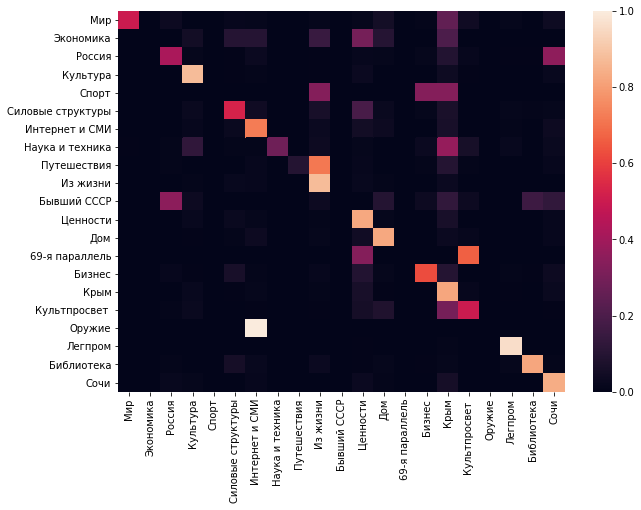

In [65]:
draw_confusions_matrix(y_true, np.array(preds_list))

### 9. Вывод, и что можно было сделать еще 

1. Опираясь на результаты алгоритмов, из всех вариантов предобработки данных я бы остановился на stemmed данных, так как такой вариант использует меньше различных токенов, и немного быстрее считается, а качество в целом не хуже чем на lemmatized данных
2. Если выбирать между линейными алгоритмами и более сложными, как нейронные сети, если необходимо быстро классифицировать тексты то я бы выбрал VW или на основе TF-IDF. Но в целом, несмотря на похожий accuracy я бы выбрал нейронную сеть, так как ошибки в ней кажутся более осмысленными.

Что можно было бы еще попробовать:
1. Использовать поле tags и title, возможно это дало бы прирост в качестве
2. Использовать более глубокие сети
3. Посмотреть на какие слова приходится максимальный градиент, когда сеть путает классы, например "Россия" и "Бывший СССР". Несмотря на удаление стоп слов, я все равно видел появление, например, названий месяцев в текстах.
4. Посмотреть, не затухает ли градиент к началу, на каких объектах он затухает.
5. Попробовать использовать другие параметры в нейронной сети, например размер ембеддингов.
6. Использовать меньший learning rate, особенно в BERT, если посмотреть на loss то кажется, что перескакивает минимум.
7. В BERT использовать самописный классификатор, а не встроенный (подцеплять только выход из енкодера). Попробовать брать представления не с последнего слоя, а с промежуточных, обучать не на сырых текстах а на предобработанных. Увеличить batch size, количество эпох, длину последовательности.